Data

In [1]:
%%shell
git clone https://github.com/yann-ro/deep-aerial.git
./deep-aerial/dataset/setup/setup_swimming.sh

Cloning into 'deep-aerial'...
remote: Enumerating objects: 210, done.
remote: Counting objects: 100% (210/210), done.
remote: Compressing objects: 100% (139/139), done.
remote: Total 210 (delta 96), reused 167 (delta 64), pack-reused 0
Receiving objects: 100% (210/210), 4.68 MiB | 17.80 MiB/s, done.
Resolving deltas: 100% (96/96), done.
--2023-02-20 16:01:49--  https://drive.google.com/uc?export=download&id=1AYKP7N8d-RR_hY5jEM3qxF1n0CGsnUkd&confirm=yes
Resolving drive.google.com (drive.google.com)... 173.194.192.102, 173.194.192.139, 173.194.192.113, ...
Connecting to drive.google.com (drive.google.com)|173.194.192.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0o-3c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/etoaaf1vqkp4hem2447deu6cucf0djs5/1676908875000/01749253850259784187/*/1AYKP7N8d-RR_hY5jEM3qxF1n0CGsnUkd?e=download&uuid=7c2bfb32-bf7d-4e78-bf87-a976b638cdaf [following]
--2023-02-20 16:01:50--  http

In [3]:
%load_ext autoreload
%autoreload 2

import torch
from torchvision import transforms
from tqdm.notebook import tqdm
import sys
import matplotlib.pyplot as plt
import numpy as np

sys.path.append("deep-aerial")
from dataset.core import InstCOCODataset
from model.display_pred_inst import display_output_inst, display_img_with_bbox


train_data_dir = 'data/swimmingPool/training/images'
train_coco = 'data/swimmingPool/training/labels.json'
test_data_dir = 'data/swimmingPool/testing/images'
test_coco = 'data/swimmingPool/testing/labels.json'

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [5]:
tfm = transforms.Compose(
    [
        transforms.ToTensor(),
    ]
)

swim_dataset_train = InstCOCODataset(
    root = train_data_dir,
    annotation = train_coco,
    transforms = tfm
)
swim_dataset_test = InstCOCODataset(
    root = test_data_dir,
    annotation = test_coco,
    transforms = tfm
)

train_batch_size = 4

data_loader = torch.utils.data.DataLoader(
    swim_dataset_train,
    batch_size = train_batch_size,
    shuffle = True, 
    num_workers = 2,
    collate_fn = collate_fn
)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


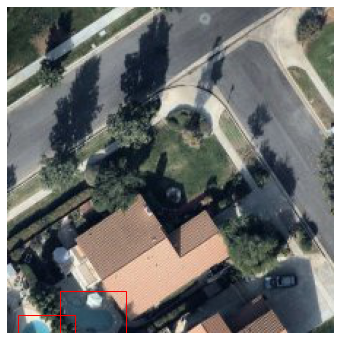

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))

img, label = swim_dataset_train[1]
display_img_with_bbox(ax, img.permute(1, 2, 0), label)

model

In [7]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import fasterrcnn_resnet50_fpn

def get_model_instance_segmentation(num_classes):
    # load an instance segmentation model pre-trained pre-trained on COCO
    model = fasterrcnn_resnet50_fpn(pretrained=False)
    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model
    

num_classes = 1+1
model = get_model_instance_segmentation(num_classes)

model.to(device)
    
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

len_dataloader = len(data_loader)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 0, Loss: 68.37104034423828


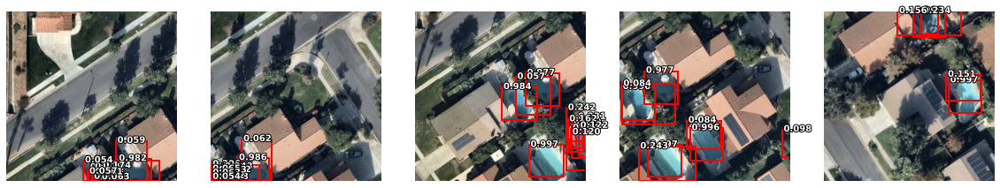

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 1, Loss: 63.217533111572266


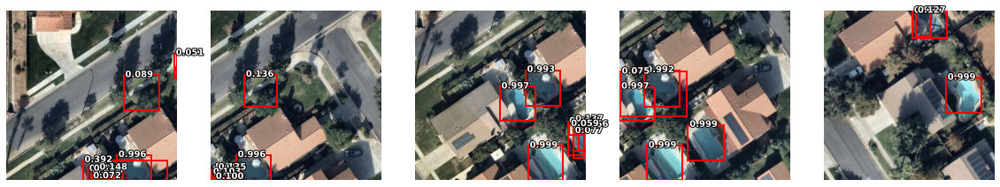

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 2, Loss: 52.36603927612305


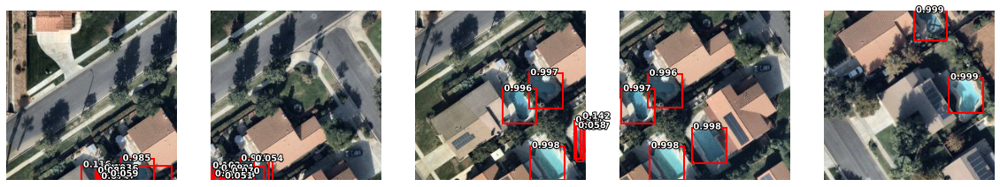

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 3, Loss: 46.19912338256836


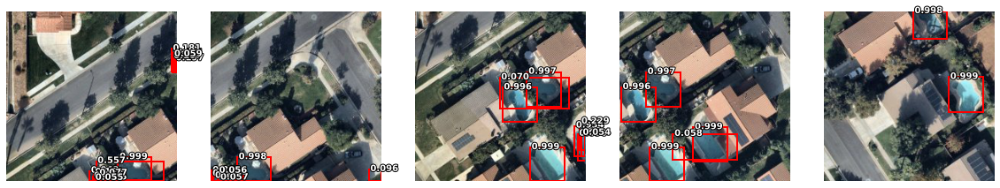

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 4, Loss: 43.83121109008789


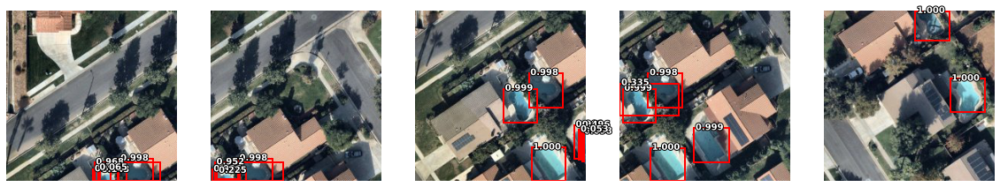

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 5, Loss: 39.42023849487305


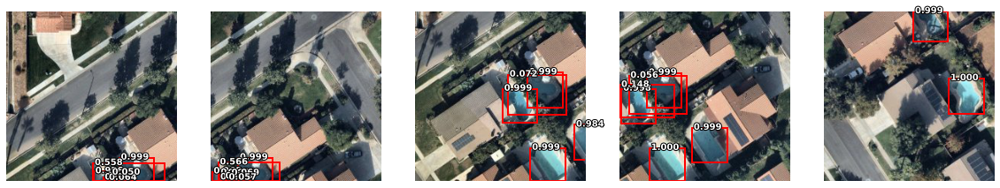

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 6, Loss: 35.30593490600586


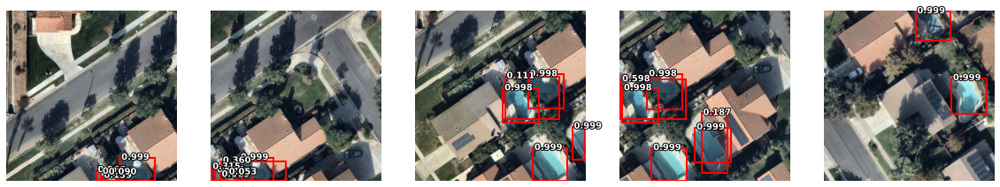

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 7, Loss: 33.50785827636719


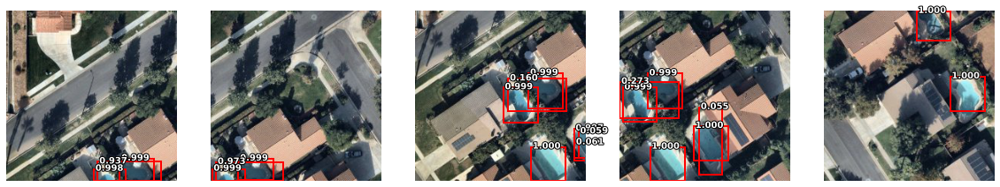

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 8, Loss: 30.16135025024414


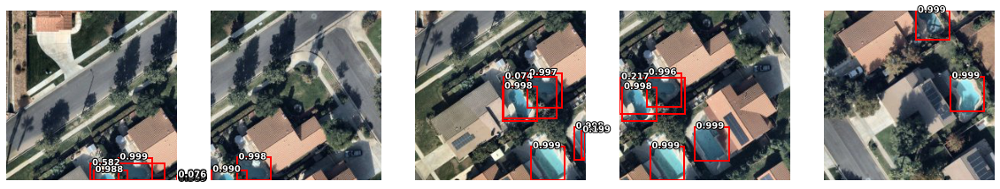

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 9, Loss: 29.818222045898438


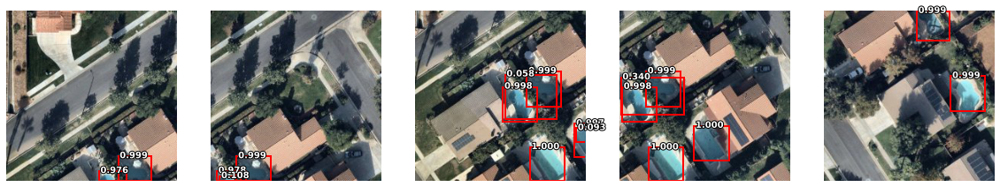

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 10, Loss: 30.7506160736084


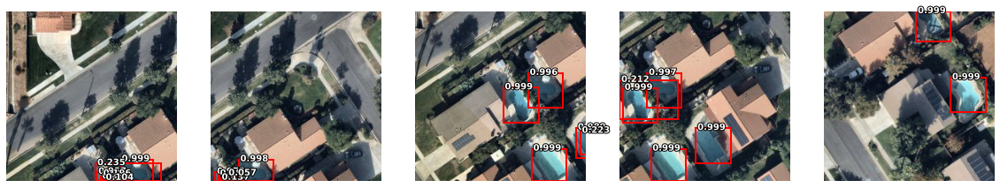

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 11, Loss: 29.060455322265625


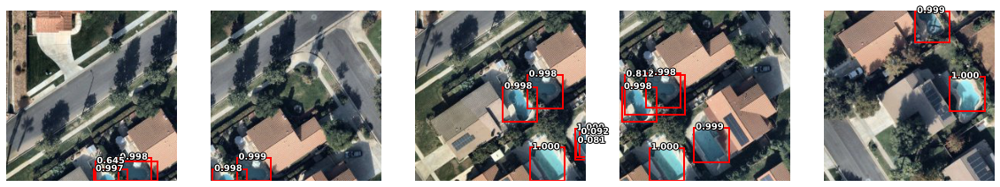

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 12, Loss: 26.500097274780273


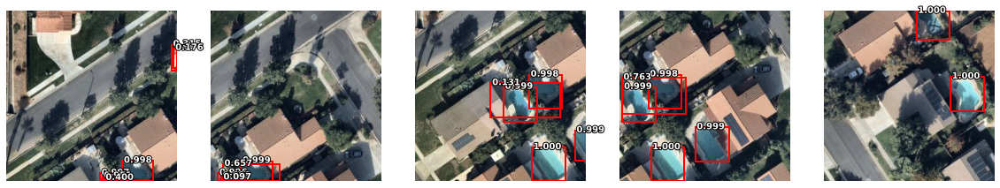

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 13, Loss: 25.137203216552734


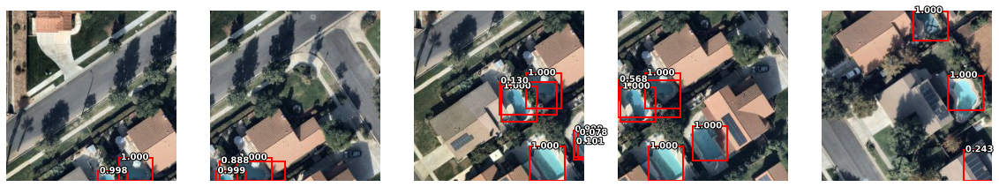

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 14, Loss: 25.461856842041016


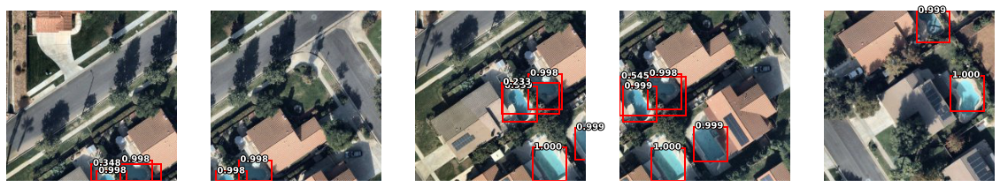

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 15, Loss: 24.382722854614258


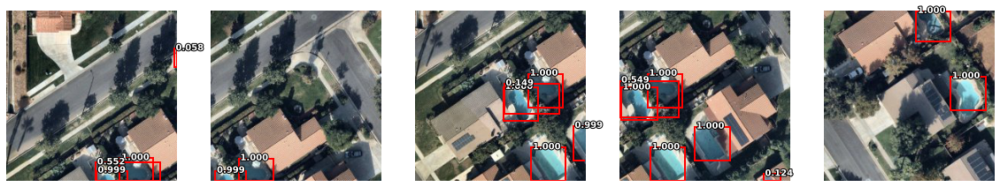

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 16, Loss: 23.731998443603516


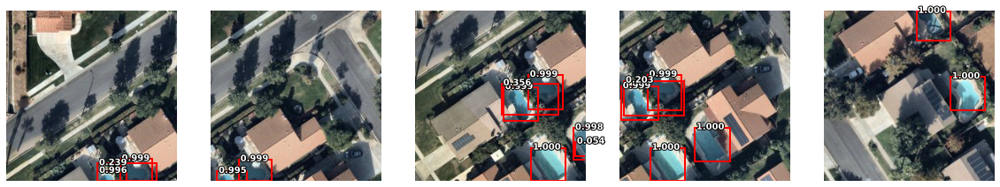

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 17, Loss: 22.644176483154297


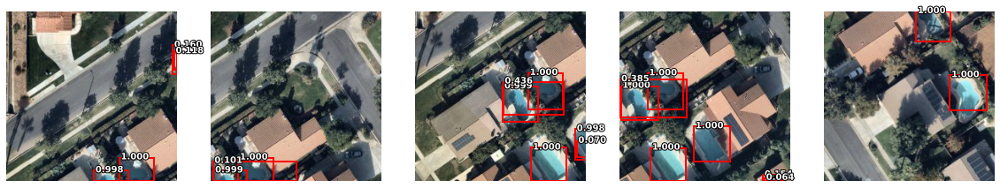

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 18, Loss: 22.752418518066406


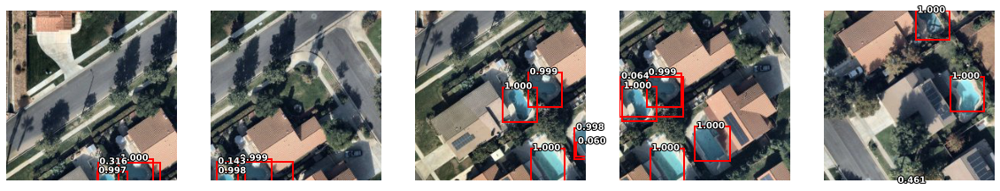

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 19, Loss: 22.138397216796875


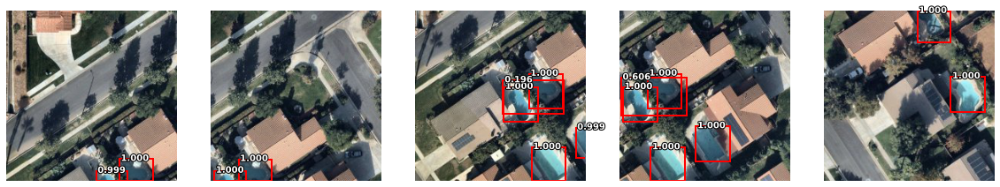

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 20, Loss: 22.38077735900879


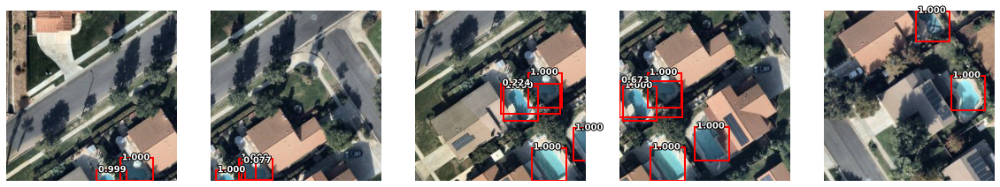

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 21, Loss: 22.0812931060791


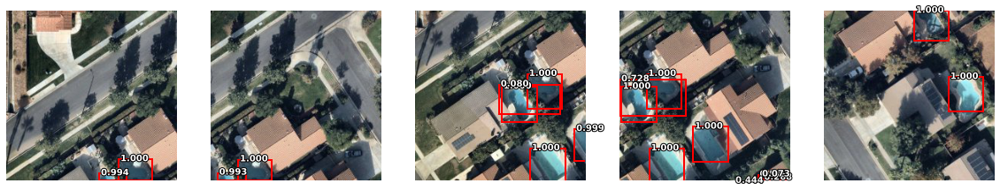

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 22, Loss: 21.582653045654297


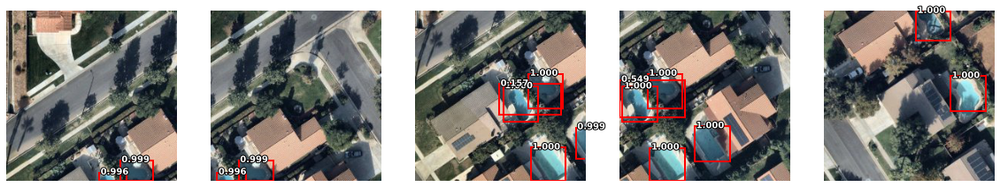

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 23, Loss: 21.05459976196289


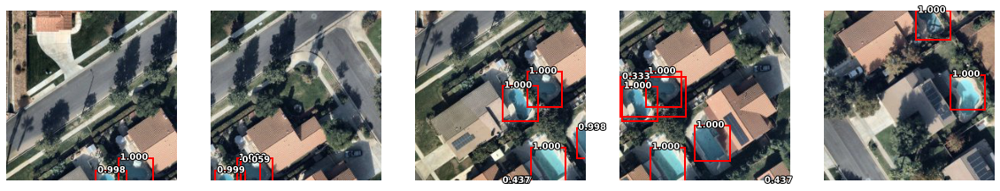

  0%|          | 0/499 [00:00<?, ?it/s]

Epoch: 24, Loss: 20.291723251342773


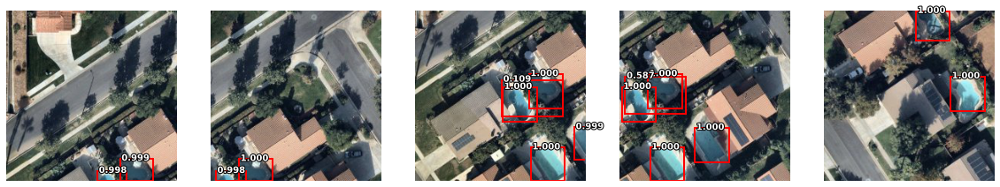

In [12]:
num_epochs = 25

for epoch in range(num_epochs):
    model.train()

    hist_loss = 0
    for imgs, annotations in tqdm(data_loader):
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        loss_dict = model(imgs, annotations)
        losses = sum(loss for loss in loss_dict.values())

        hist_loss += losses

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    print(f'Epoch: {epoch}, Loss: {hist_loss}')

    display_output_inst(model, swim_dataset_train, device, [0,1,2,3,4])

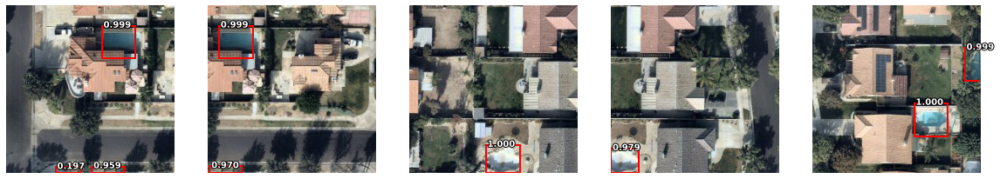

In [13]:
display_output_inst(model, swim_dataset_test, device, [0,1,2,3,4])